In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

In [2]:
# Extraccion de datos filtrados de los archivos csv
tables = ["draft_history_stats", "game_data", "inactive_players", "play_by_play", "player_info", "players",
          "team_info"]

# Cargar cada archivo csv en un DataFrame con el nombre del elemento en tables
for table_name in tables:
    globals()[table_name] = pd.read_csv(f"C:\\DB_filtrado_csv\\f_{table_name}.csv")
    info_eventmsgtype = pd.read_csv(f"C:\\DB_filtrado_csv\\info_eventmsgtype.csv")

In [3]:
#Explorar columnas de la tabla 'draft_history_stats'
draft_history_stats.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'draft_season', 'player_id',
       'player_name', 'position', 'height', 'height_w_shoes', 'weight',
       'wingspan', 'standing_reach', 'body_fat_pct', 'hand_length',
       'hand_width', 'standing_vertical_leap', 'max_vertical_leap',
       'lane_agility_time', 'modified_lane_agility_time',
       'three_quarter_sprint', 'bench_press', 'spot_fifteen_corner_left',
       'spot_fifteen_break_left', 'spot_fifteen_top_key',
       'spot_fifteen_break_right', 'spot_fifteen_corner_right',
       'spot_college_corner_left', 'spot_college_break_left',
       'spot_college_top_key', 'spot_college_break_right',
       'spot_college_corner_right', 'spot_nba_corner_left',
       'spot_nba_break_left', 'spot_nba_top_key', 'spot_nba_break_right',
       'spot_nba_corner_right', 'off_drib_fifteen_break_left',
       'off_drib_fifteen_top_key', 'off_drib_fifteen_break_right',
       'off_drib_college_break_left', 'off_drib_college_top_key',
       'off_drib_coll

In [4]:
#Contar temporadas (draft_season)
draft_history_stats['draft_season'].unique()

array([2013, 2014, 2015, 2017, 2018, 2019])

In [5]:
#Contamos el número de jugadores en la tabla
draft_history_stats['player_id'].nunique()

228

In [6]:
#Identicar posiciones de juego
draft_history_stats['position'].value_counts()   

position
PG       47
PF       47
SG       45
SF       26
C        17
SG-SF    16
SF-SG    10
PF-C      7
SF-PF     5
PG-SG     5
PF-SF     3
SG-PG     3
C-PF      2
Name: count, dtype: int64

In [7]:
#Generamos una nueva columna de posición para dejar solo la posición de juego principal, la que aparece primero.
draft_history_stats['principal_position'] = draft_history_stats['position']
#Renombramos los valores de las posiciones dejando solo la que aparece primero.
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'PG': 'Point Guard'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'PF': 'Power Forward'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'SG': 'Shooting Guard'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'SF': 'Small Forward'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'C': 'Center'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'SG-SF': 'Shooting Guard'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'SF-SG': 'Small Forward'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'PF-C': 'Power Forward'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'SF-PF': 'Small Forward'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'PG-SG': 'Point Guard'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'PF-SF': 'Power Forward'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'SG-PG': 'Shooting Guard'})
draft_history_stats['principal_position'] = draft_history_stats['principal_position'].replace({'C-PF': 'Center'})
#Vemos que solo quedaron las cinco posiciones de juego que existen.
draft_history_stats['principal_position'].value_counts()

principal_position
Shooting Guard    64
Power Forward     57
Point Guard       52
Small Forward     41
Center            19
Name: count, dtype: int64

[]

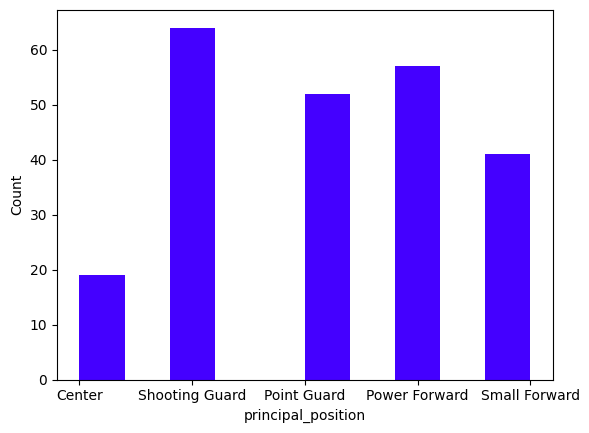

In [8]:
#Graficamos las posiciones de juego principal
plt.hist(draft_history_stats['principal_position'], histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('principal_position')
plt.ylabel('Count')
plt.plot()

In [9]:
#Convertimos medidas en pulgadas a centímetros y peso en libras a kilogramos
draft_history_stats['height'] = draft_history_stats['height'] * 2.54
draft_history_stats['weight']= draft_history_stats['weight'] * 0.45359237
draft_history_stats['wingspan'] = draft_history_stats['wingspan'] * 2.54
draft_history_stats['standing_reach'] = draft_history_stats['standing_reach'] * 2.54
draft_history_stats['hand_length'] = draft_history_stats['hand_length'] * 2.54
draft_history_stats['hand_width'] = draft_history_stats['hand_width'] * 2.54
draft_history_stats['standing_vertical_leap'] = draft_history_stats['standing_vertical_leap'] * 2.54


In [10]:
#Resumimos las características físicas de los jugadores y las asignamos a una tabla 'ph_measures'.
#draft_history_stats.iloc[:, 6:15].describe().round(2) # se cambió para usar la variable ph_measures después.
ph_measures = draft_history_stats[['height','weight','wingspan','standing_reach','body_fat_pct','hand_length','hand_width','standing_vertical_leap']]
ph_measures.describe().round(2)

,height,weight,wingspan,standing_reach,body_fat_pct,hand_length,hand_width,standing_vertical_leap
count,233.00,233.00,233.00,233.00,233.00,233.00,233.00,233.00
mean,195.88,95.69,208.29,260.68,6.66,22.03,23.76,72.92
std,8.43,10.77,10.30,12.38,2.29,1.27,1.77,14.81
min,176.53,72.57,177.80,227.33,2.90,19.05,17.78,0.00
25%,190.50,87.72,201.30,252.73,5.00,20.96,22.22,69.85
50%,196.22,94.62,208.92,261.62,6.10,22.22,24.13,74.93
75%,201.30,103.06,215.90,270.51,7.60,22.86,24.76,80.01
max,226.70,131.00,249.56,311.15,16.30,26.67,29.21,96.52


In [11]:
#Eliminamos los '0' de los cálculos de standing_vertical_leap ya que sesgó los resultados (no puede un salto de 0)
#Filtramos para excluir los valores cero en la columna 'standing_vertical_leap'
standing_vertical_leap_sin0 = ph_measures[ph_measures['standing_vertical_leap'] != 0]

# Obtener el resumen estadístico sin incluir los ceros
standing_vertical_leap_sin0['standing_vertical_leap'].describe().round(2)

count    226.00
mean      75.17
std        7.45
min       55.88
25%       69.85
50%       74.93
75%       80.01
max       96.52
Name: standing_vertical_leap, dtype: float64

[]

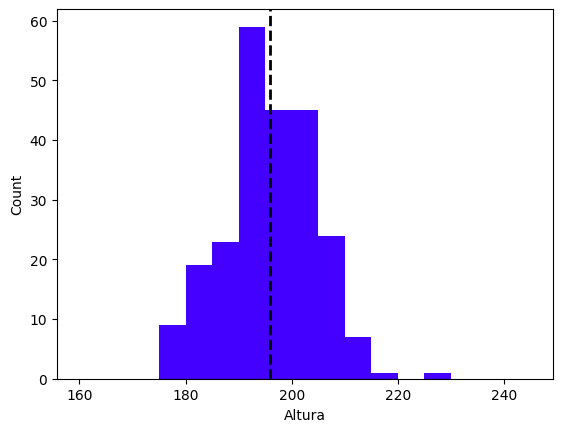

In [12]:
#Graficamos las características físicas de los jugadores: altura
bins=range(160,250,5)
plt.hist(ph_measures["height"],bins, histtype="bar",rwidth=1.2,color='#4400ff')
#plt.title('Altura')
plt.xlabel('Altura')
plt.ylabel('Count')
plt.axvline(ph_measures["height"].mean(), color='black', linestyle='dashed', linewidth=2)
plt.plot()

[]

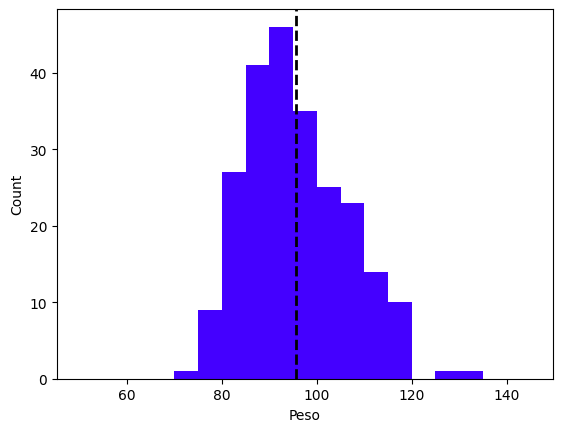

In [13]:
#Graficamos las características físicas de los jugadores: peso
bins=range(50,150,5)
plt.hist(ph_measures["weight"],bins, histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('Peso')
plt.ylabel('Count')
plt.axvline(ph_measures["weight"].mean(), color='black', linestyle='dashed', linewidth=2)
plt.plot()

[]

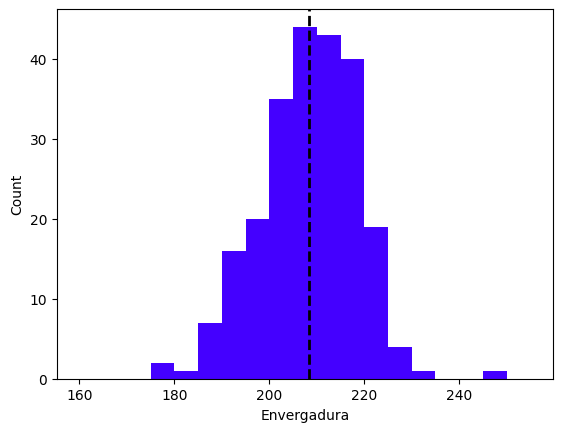

In [14]:
#Graficamos las características físicas de los jugadores: envergadura
bins=range(160,260,5)
plt.hist(ph_measures['wingspan'],bins, histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('Envergadura')
plt.ylabel('Count')
plt.axvline(ph_measures["wingspan"].mean(), color='black', linestyle='dashed', linewidth=2)
plt.plot()

[]

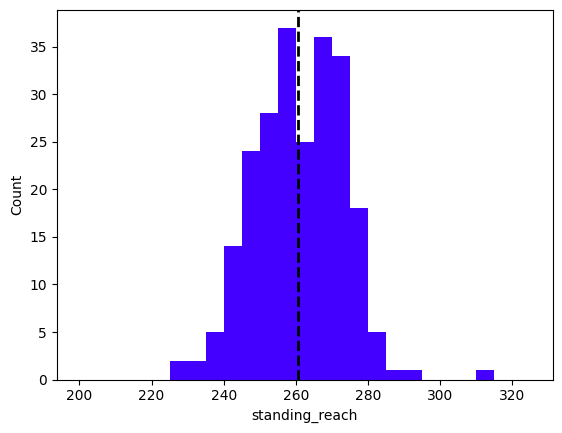

In [15]:
#Graficamos las características físicas de los jugadores: Altura con los brazos hacia arriba
bins=range(200,330,5)
plt.hist(ph_measures['standing_reach'],bins,histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('standing_reach')
plt.ylabel('Count')
plt.axvline(ph_measures["standing_reach"].mean(), color='black', linestyle='dashed', linewidth=2)
plt.plot()

[]

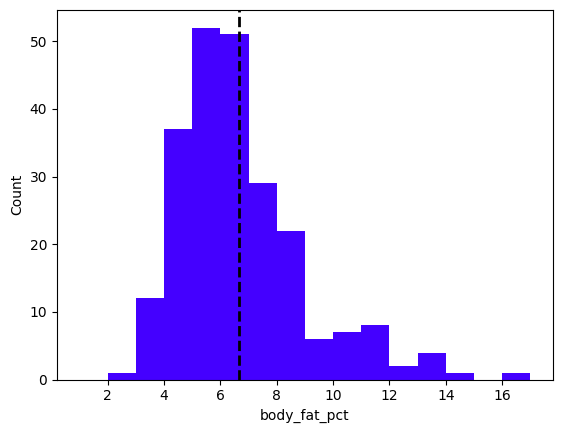

In [16]:
#Graficamos las características físicas de los jugadores: porcentaje de grasa corporal
bins=range(1,18,1)
plt.hist(ph_measures['body_fat_pct'],bins,histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('body_fat_pct')
plt.ylabel('Count')
plt.axvline(ph_measures["body_fat_pct"].mean(), color='black', linestyle='dashed', linewidth=2)
plt.plot()

[]

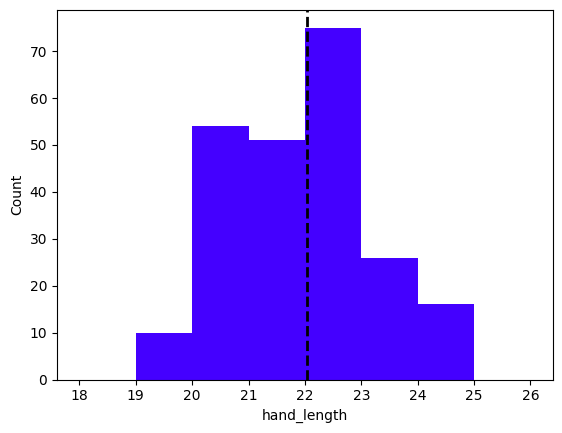

In [17]:
#Graficamos las características físicas de los jugadores: longitud de la mano
bins=range(18,27,1)
plt.hist(ph_measures['hand_length'],bins,histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('hand_length')
plt.ylabel('Count')
plt.axvline(ph_measures["hand_length"].mean(), color='black', linestyle='dashed', linewidth=2)
plt.plot()

[]

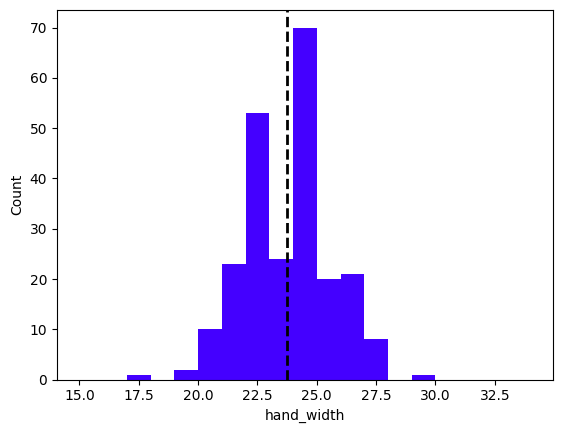

In [18]:
#Graficamos las características físicas de los jugadores: ancho de la mano
bins=range(15,35,1)
plt.hist(ph_measures['hand_width'],bins,histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('hand_width')
plt.ylabel('Count')
plt.axvline(ph_measures["hand_width"].mean(), color='black', linestyle='dashed', linewidth=2)
plt.plot()

[]

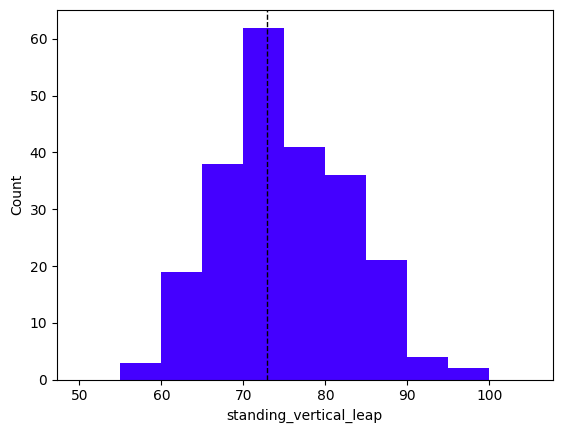

In [19]:
#Graficamos las características físicas de los jugadores: salto vertical
bins=range(50,110,5)
plt.hist(ph_measures['standing_vertical_leap'],bins,histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('standing_vertical_leap')
plt.ylabel('Count')
plt.axvline(ph_measures["standing_vertical_leap"].mean(), color='black', linestyle='dashed', linewidth=1)
plt.plot()

In [20]:
#Resumir medidas de desempeño (1era parte)
#draft_history_stats.iloc[:, 16:20].describe().round(2) # se cambió para usar la variable performance1 más adelante.
performance1 = draft_history_stats[['lane_agility_time','modified_lane_agility_time','three_quarter_sprint','bench_press']]
performance1.describe().round(2)

,lane_agility_time,modified_lane_agility_time,three_quarter_sprint,bench_press
count,233.00,233.00,233.00,233.00
mean,10.97,2.99,3.18,6.73
std,2.15,0.66,0.61,5.48
min,0.00,0.00,0.00,0.00
25%,10.84,2.98,3.19,0.00
50%,11.26,3.09,3.27,7.00
75%,11.64,3.23,3.36,11.00
max,13.01,3.76,3.78,21.00


In [21]:
#Se va a considera que los ceros son valores faltantes, entonces, no se incluirán en los cálculos
#Reemplazar los ceros por NaN en las columnas, a fin de no sesgar los cálculos, las funciones omiten valores nulos.
performance1 = performance1.replace(0, np.nan)

# Obtener el resumen estadístico sin considerar los ceros
print(performance1.describe().round(2))

       lane_agility_time  modified_lane_agility_time  three_quarter_sprint  \
count             225.00                      223.00                225.00   
mean               11.36                        3.12                  3.29   
std                 0.60                        0.18                  0.13   
min                 9.97                        2.70                  3.02   
25%                10.91                        3.00                  3.20   
50%                11.28                        3.10                  3.28   
75%                11.68                        3.24                  3.37   
max                13.01                        3.76                  3.78   

       bench_press  
count       173.00  
mean          9.06  
std           4.39  
min           1.00  
25%           6.00  
50%           9.00  
75%          12.00  
max          21.00  


In [22]:
#Resumir medidas de desempeño (2da parte, "spots")
#draft_history_stats.iloc[:, 21:35].describe().round(2) # se cambió para usar la variable performance2 después.
performance2 = draft_history_stats[['spot_fifteen_break_left','spot_fifteen_top_key','spot_fifteen_break_right','spot_fifteen_corner_right', 'spot_college_corner_left', 'spot_college_break_left', 'spot_college_top_key', 'spot_college_break_right', 'spot_college_corner_right', 'spot_nba_corner_left', 'spot_nba_break_left', 'spot_nba_top_key', 'spot_nba_break_right','spot_nba_corner_right']]
# Continuaresmos omitiendo en los cálculos los valores 0
performance2 = performance2.replace(0, np.nan)
performance2.describe().round(2)

,spot_fifteen_break_left,spot_fifteen_top_key,spot_fifteen_break_right,spot_fifteen_corner_right,spot_college_corner_left,spot_college_break_left,spot_college_top_key,spot_college_break_right,spot_college_corner_right,spot_nba_corner_left,spot_nba_break_left,spot_nba_top_key,spot_nba_break_right,spot_nba_corner_right
count,76.00,76.00,74.00,76.00,163.00,163.00,164.00,166.00,162.00,211.00,208.00,214.00,209.00,209.00
mean,0.68,0.68,0.64,0.65,0.61,0.62,0.64,0.63,0.60,0.60,0.59,0.57,0.57,0.58
std,0.19,0.21,0.23,0.20,0.24,0.24,0.23,0.23,0.22,0.22,0.23,0.23,0.21,0.21
min,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20,0.20
25%,0.60,0.60,0.60,0.60,0.40,0.40,0.40,0.40,0.40,0.40,0.40,0.40,0.40,0.40
50%,0.60,0.60,0.60,0.60,0.60,0.60,0.60,0.60,0.60,0.60,0.60,0.60,0.60,0.60
75%,0.80,0.80,0.80,0.80,0.80,0.80,0.80,0.80,0.80,0.80,0.80,0.80,0.80,0.80
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [23]:
#Resumir medidas de desempeño (3era parte)
#draft_history_stats.iloc[:, 36:43].describe().round(2) # se cambió para usar la variable performance3 después.
performance3 = draft_history_stats[['off_drib_fifteen_top_key', 'off_drib_fifteen_break_right', 'off_drib_college_break_left', 'off_drib_college_top_key', 'off_drib_college_break_right', 'on_move_fifteen', 'on_move_college']]
# Continuaresmos omitiendo en los cálculos los valores 0 en medidas de desempeño
performance3 = performance3.replace(0, np.nan)
performance3.describe().round(2)

,off_drib_fifteen_top_key,off_drib_fifteen_break_right,off_drib_college_break_left,off_drib_college_top_key,off_drib_college_break_right,on_move_fifteen,on_move_college
count,164.00,161.00,31.00,31.00,31.00,146.00,40.00
mean,0.60,0.59,0.59,0.62,0.58,0.63,0.63
std,0.20,0.23,0.19,0.22,0.21,0.12,0.12
min,0.17,0.12,0.25,0.12,0.25,0.21,0.20
25%,0.50,0.50,0.50,0.50,0.50,0.57,0.59
50%,0.62,0.67,0.50,0.67,0.50,0.64,0.63
75%,0.75,0.75,0.75,0.75,0.75,0.69,0.70
max,1.00,1.00,1.00,1.00,1.00,0.88,0.82


In [24]:
# Explorar columna draft_type
draft_history_stats['draft_type'].value_counts()
# Si esta variable es la que indica si el jugador fue drafteado o no, se cambiará a vales 1 (drafted) y 0 (not drafted).

draft_type
0        118
Draft    115
Name: count, dtype: int64

In [25]:
#Consideraremos la columna draft_type como variable dependiente a fin de ver si las demás tienen relación con la selección (drafted o no, 1 y 0)
#Reemplazar 'draft' con 1 en la columna draft_type
draft_history_stats['draft_type'] = draft_history_stats['draft_type'].replace({'Draft': 1})

# Cambiar el tipo de dato a int
draft_history_stats['draft_type'] = draft_history_stats['draft_type'].astype(int)
draft_history_stats['draft_type'].value_counts()

draft_type
0    118
1    115
Name: count, dtype: int64

In [26]:
#Contar la frecuencia de 'organización' para ver si se puede analizar más adelante.
draft_history_stats['organization'].value_counts()


organization
0                         118
Kansas                      5
California-Los Angeles      5
Michigan                    5
North Carolina              4
                         ... 
San Diego                   1
Yale                        1
Utah State                  1
Nebraska                    1
KK Olimpija (Slovenia)      1
Name: count, Length: 72, dtype: int64

In [27]:
#Contar la frecuencia de tipo de organización para ver si se puede analizar más adelante.
draft_history_stats['organization_type'].value_counts() 

organization_type
0                     118
College/University    112
Other Team/Club         2
High School             1
Name: count, dtype: int64

In [28]:
draft_history_stats['organization_type'].value_counts(normalize=True) * 100

organization_type
0                     50.643777
College/University    48.068670
Other Team/Club        0.858369
High School            0.429185
Name: proportion, dtype: float64

[]

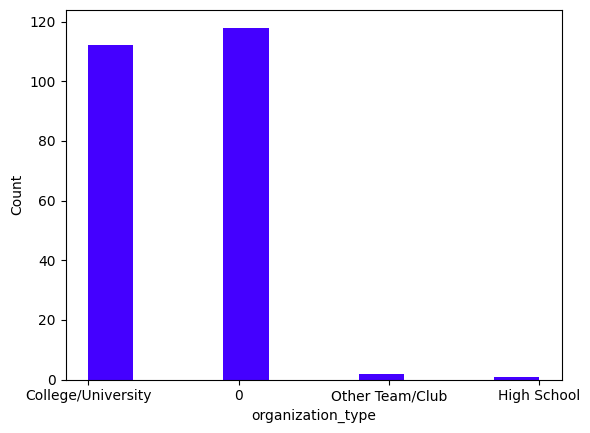

In [29]:
#Graficamos el tipo de organización
plt.hist(draft_history_stats['organization_type'], histtype="bar", rwidth=1.2,color='#4400ff')
plt.xlabel('organization_type')
plt.ylabel('Count')
plt.plot()

C:\Users\opqui\AppData\Local\Temp\ipykernel_18200\3801478393.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ph_measures['draft_type'] = draft_history_stats['draft_type']


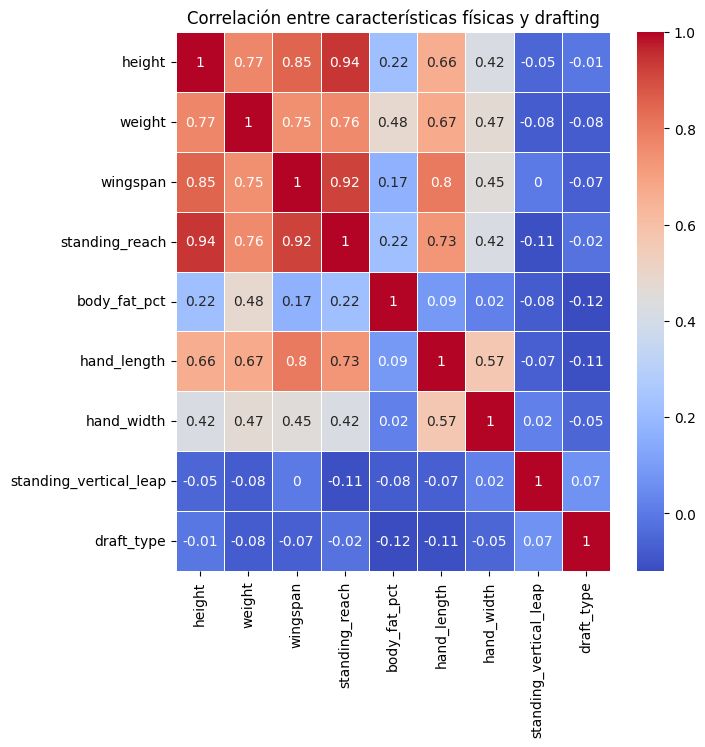

In [30]:
# Calculamos la matriz de  correlaciones de las medidas físicas de jugadores con la columna "draft_type"
ph_measures['draft_type'] = draft_history_stats['draft_type']
matrixph = ph_measures.corr().round(2)
#Graficamos
plt.figure(figsize=(7, 7))
sns.heatmap(matrixph, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlación entre características físicas y drafting')
plt.show()

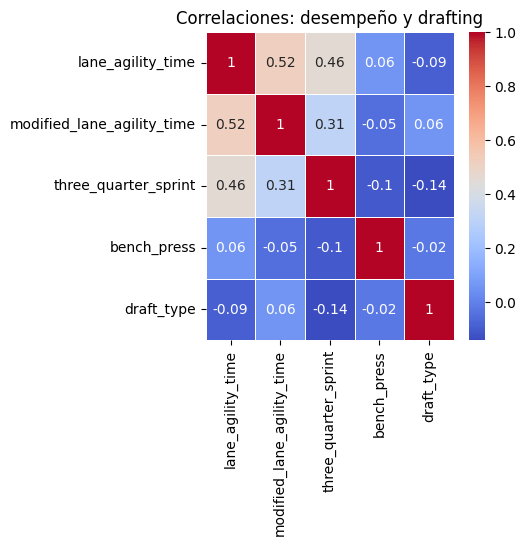

In [31]:
# Calculamos la matriz de  correlaciones de las medidas de desempeño con la columna "draft_type"
performance1['draft_type'] = draft_history_stats['draft_type']
matrix1 = performance1.corr().round(2)
# Graficamos
plt.figure(figsize=(4, 4))
sns.heatmap(matrix1, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlaciones: desempeño y drafting')
plt.show()

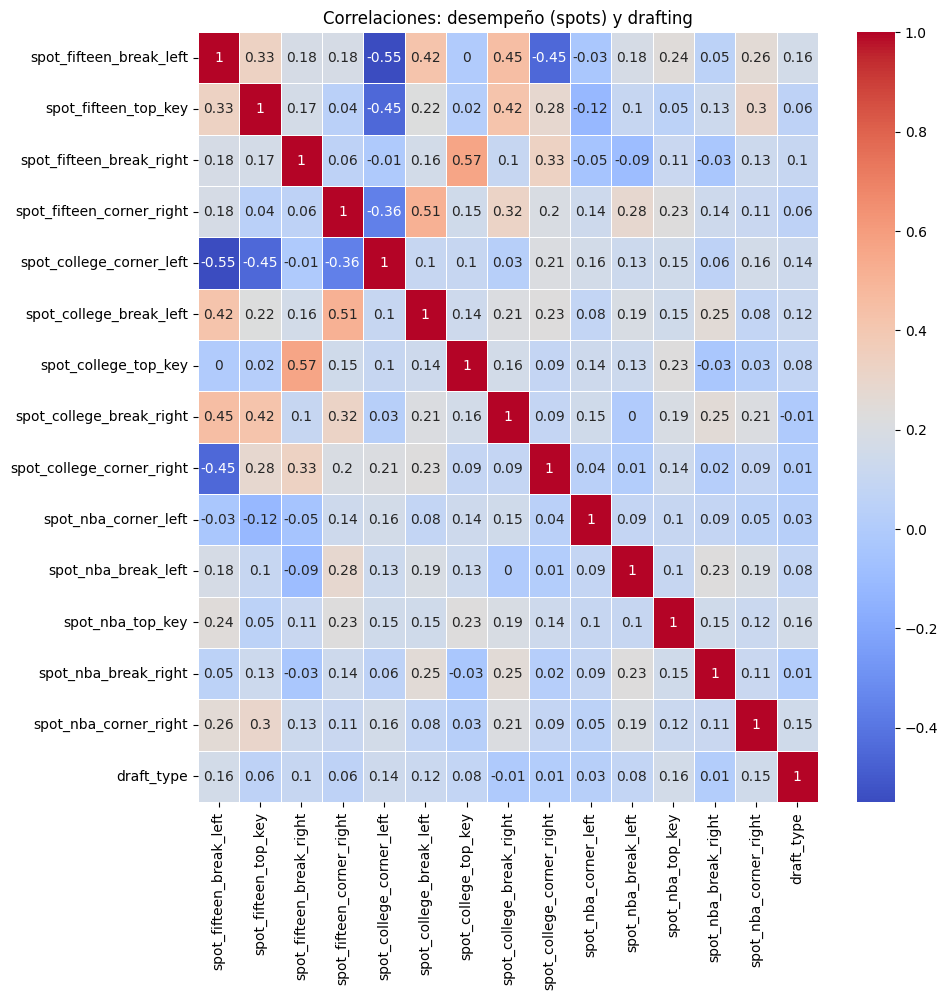

In [32]:
# Calculamos la matriz de  correlaciones de las medidas de desempeño con la columna "draft_type"
performance2['draft_type'] = draft_history_stats['draft_type']
matrix2 = performance2.corr().round(2)
# Graficasmos
plt.figure(figsize=(10, 10))
sns.heatmap(matrix2, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlaciones: desempeño (spots) y drafting')
plt.show()

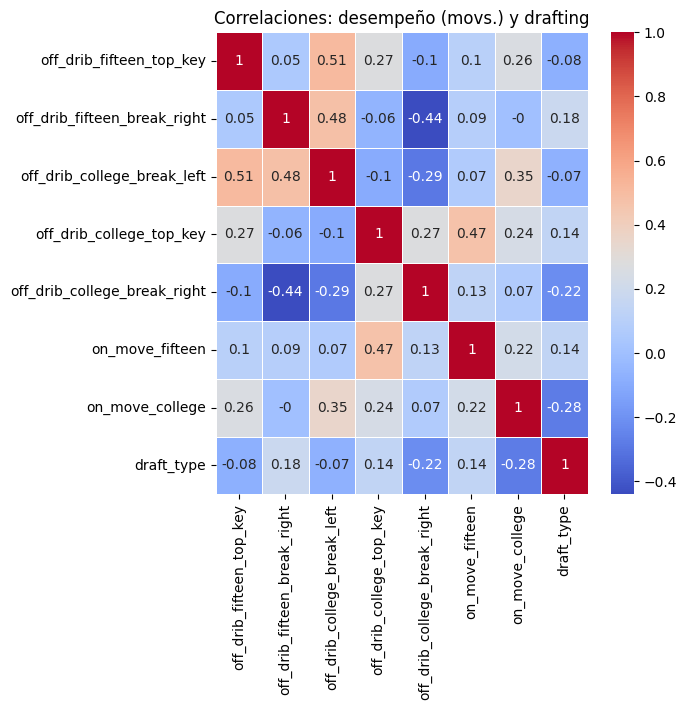

In [33]:
# Calculamos la matriz de  correlaciones de las medidas de desempeño con la columna "draft_type"
performance3['draft_type'] = draft_history_stats['draft_type']
matrix3 = performance3.corr().round(2)
# Graficamos
plt.figure(figsize=(6, 6))
sns.heatmap(matrix3, annot=True, cmap= 'coolwarm', linewidths=0.5)
plt.title('Correlaciones: desempeño (movs.) y drafting')
plt.show()

In [34]:
# Exploramos la tabla f_player_info
player_info.columns

Index(['Unnamed: 0', 'player_id', 'player_name', 'birthdate', 'school',
       'country', 'last_affiliation', 'season_exp', 'jersey', 'rosterstatus',
       'games_played_current_season_flag', 'team_id', 'team_name',
       'team_abbreviation', 'team_code', 'team_city', 'playercode',
       'from_year', 'to_year', 'dleague_flag', 'nba_flag', 'games_played_flag',
       'round_pick', 'draft_number', 'greatest_75_flag', 'is_active'],
      dtype='object')

In [35]:
player_info.describe().round(2)

,Unnamed: 0,player_id,season_exp,jersey,team_id,from_year,to_year,is_active
count,156.00,156.00,156.00,156.00,1.560000e+02,156.00,156.00,156.00
mean,77.50,1080503.99,4.35,10.88,1.073742e+09,2016.32,2019.88,0.39
std,45.18,695430.16,2.41,13.93,7.616954e+08,2.43,3.12,0.49
min,0.00,203318.00,1.00,0.00,0.000000e+00,2013.00,2013.00,0.00
25%,38.75,203896.50,3.00,0.00,0.000000e+00,2014.00,2017.00,0.00
50%,77.50,1627295.50,4.00,5.50,1.610613e+09,2017.00,2021.00,0.00
75%,116.25,1629004.50,5.00,18.00,1.610613e+09,2019.00,2023.00,1.00
max,155.00,1629684.00,10.00,88.00,1.610613e+09,2021.00,2023.00,1.00


In [36]:
#Calculamos cuántos años jugó cada jugador en la NBA y lo agregamos a la tabla
player_info['years_played'] = player_info['to_year'] - player_info['from_year'] + 1
player_info['years_played'].describe().round(2)


count    156.00
mean       4.56
std        2.85
min        1.00
25%        2.00
50%        4.00
75%        6.00
max       11.00
Name: years_played, dtype: float64

[]

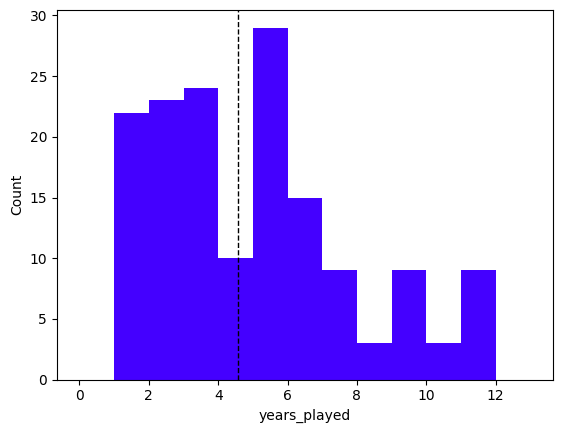

In [37]:
#Graficamos los años jugados en la NBA
bins=range(0,14,1)
plt.hist(player_info['years_played'],bins, histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('years_played')
plt.ylabel('Count')
plt.axvline(player_info['years_played'].mean(), color='black', linestyle='dashed', linewidth=1)
plt.plot()

In [38]:
#Exploramos la columna dleague_flag que indica si el jugador estuvo en la liga menor de la NBA
player_info['dleague_flag'].value_counts()

dleague_flag
Y    136
N     20
Name: count, dtype: int64

In [39]:
#Generamos un columna con dleague_flag pero en formato de 0 (no estuvo) y 1 (sí estuvo)
player_info['dleague_flag_bolean'] = player_info['dleague_flag']
player_info['dleague_flag_bolean'] = player_info['dleague_flag_bolean'].replace({'Y': 1})
player_info['dleague_flag_bolean'] = player_info['dleague_flag_bolean'].replace({'N': 0})

# Cambiar el tipo de dato a int
draft_history_stats['dleague_flag_bolean'] = draft_history_stats['draft_type'].astype(int)
#Comprobamos
player_info['dleague_flag_bolean'].value_counts()


C:\Users\opqui\AppData\Local\Temp\ipykernel_18200\4234984822.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  player_info['dleague_flag_bolean'] = player_info['dleague_flag_bolean'].replace({'N': 0})


dleague_flag_bolean
1    136
0     20
Name: count, dtype: int64

[]

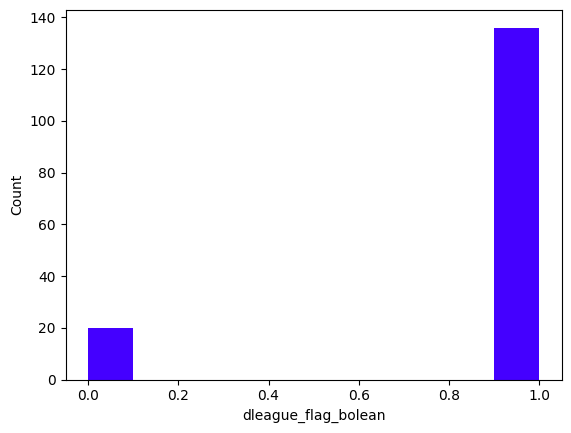

In [40]:
#Graficamos si el jugador estuvo en la liga menor de la NBA
plt.hist(player_info["dleague_flag_bolean"], histtype="bar",rwidth=1.2,color='#4400ff')
plt.xlabel('dleague_flag_bolean')
plt.ylabel('Count')
plt.plot()

In [41]:
player_info['country'].unique()

array(['USA', 'New Zealand', 'Greece', 'Nigeria', 'Canada', 'Senegal',
       'Angola', 'France', 'Finland', 'Ukraine', 'Antigua and Barbuda',
       'Portugal', 'Croatia'], dtype=object)

[]

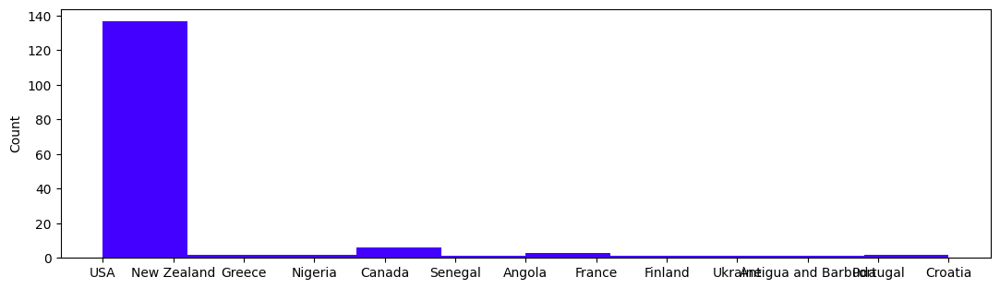

In [42]:
#Graficamos la frecuencia de países
plt.figure(figsize=(13, 3.5))
plt.hist(player_info["country"], histtype="bar",rwidth=1.2,color='#4400ff')
#plt.xlabel('country')
plt.ylabel('Count')
plt.plot()

In [43]:
# Creamos la nueva columna 'country_group' dividir a USA (1) y otros países (0)
player_info['country_group'] = np.where(player_info['country'] == 'USA', '1', '0')

# Verificar el resultado
player_info['country_group'].value_counts()


country_group
1    136
0     20
Name: count, dtype: int64

[]

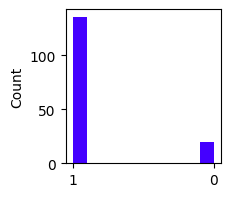

In [44]:
#Graficamos los países
plt.figure(figsize=(2, 2))
plt.hist(player_info["country_group"], histtype="bar",rwidth=1.2,color='#4400ff')
#plt.xlabel('country')
plt.ylabel('Count')
plt.plot()

In [48]:
player_inf

,years_played,dleague_flag_bolean,country_group
0,2.0,1,1
1,11.0,0,0
2,1.0,1,1
3,3.0,1,1
4,7.0,1,1
...,...,...,...
151,4.0,1,1
152,4.0,1,1
153,5.0,0,1
154,5.0,0,1


In [53]:
# Calculamos la matriz de  correlaciones para las columnas numéricas
player_inf = player_info[['player_id', 'years_played', 'dleague_flag_bolean', 'country_group']]
#
player_inf = player_inf.merge(draft_history_stats[['player_id', 'draft_type']],
    on='player_id',
    how='inner'
)
# Calcula la matriz de correlación de las últimas cuatro columnas
matrix_player = player_inf.iloc[:, 1:].corr().round(2)
print(matrix_player)


                     years_played  dleague_flag_bolean  country_group  \
years_played                 1.00                -0.30          -0.13   
dleague_flag_bolean         -0.30                 1.00           0.13   
country_group               -0.13                 0.13           1.00   
draft_type                   0.26                -0.13          -0.11   

                     draft_type  
years_played               0.26  
dleague_flag_bolean       -0.13  
country_group             -0.11  
draft_type                 1.00  


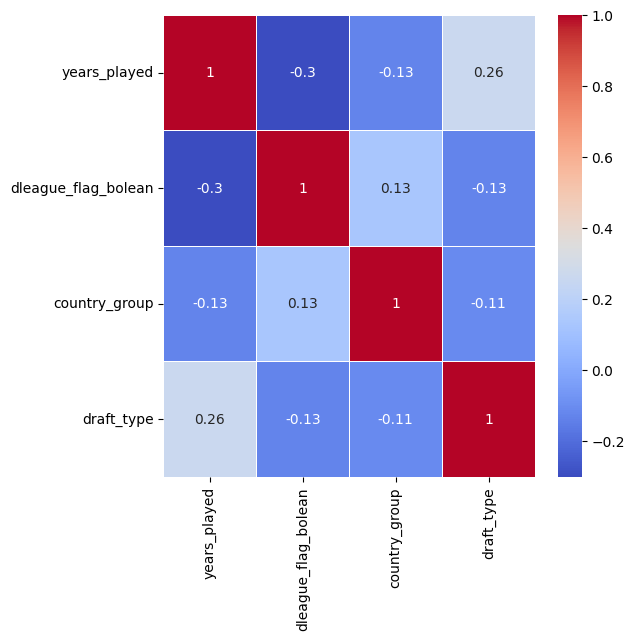

In [54]:
# Graficamos
plt.figure(figsize=(6, 6))
sns.heatmap(matrix_player, annot=True, cmap= 'coolwarm', linewidths=0.5)
#plt.title('Corr')
plt.show()

In [56]:
#Exploramos la tabla 'f_inactive_players'
inactive_players.columns
#Indica qué juagadores estuvieron inactivos en los partidos

Index(['Unnamed: 0', 'game_id', 'player_id', 'jersey', 'team_id', 'team_city',
       'team_name', 'team_abbreviation'],
      dtype='object')

In [57]:
#Tabla f_inactive_players 
inactive_players['team_name'].unique()

array(['Kings', 'Cavaliers', 'Bobcats', 'Rockets', 'Mavericks', 'Pistons',
       'Pelicans', 'Thunder', 'Jazz', 'Wizards', 'Pacers', '76ers',
       'Clippers', 'Timberwolves', 'Trail Blazers', 'Suns', 'Magic',
       'Bucks', 'Celtics', 'Nets', 'Nuggets', 'Grizzlies', 'Bulls',
       'Hornets', 'Knicks', 'Hawks', 'Warriors', 'Heat', 'Lakers',
       'Spurs', 'Raptors'], dtype=object)

In [58]:
#Exploramos la tabla 'f_players'
players.columns
#Solo tiene el id y nombre del jugador
players.describe

<bound method NDFrame.describe of      Unnamed: 0  player_id               player_name
0             0     203500              Steven Adams
1             1     203505               Vander Blue
2             2     203485             Lorenzo Brown
3             3     203493            Reggie Bullock
4             4     203484  Kentavious Caldwell-Pope
..          ...        ...                       ...
224         227    1629677              Luka Samanic
225         228    1629679           Simisola Shittu
226         229    1629682            Tremont Waters
227         230    1629683    Quinndary Weatherspoon
228         232    1629684            Grant Williams

[229 rows x 3 columns]>

In [ ]:
#Exploramos la tabla 'f_team_info'
team_info.describe
#Contiene id del equipo, nombre y nombre abreviado.

<bound method NDFrame.describe of     Unnamed: 0     team_id               team_name team_abbreviation  \
0            0  1610612737           Atlanta Hawks               ATL   
1            1  1610612738          Boston Celtics               BOS   
2            2  1610612739     Cleveland Cavaliers               CLE   
3            3  1610612740    New Orleans Pelicans               NOP   
4            4  1610612741           Chicago Bulls               CHI   
5            5  1610612742        Dallas Mavericks               DAL   
6            6  1610612743          Denver Nuggets               DEN   
7            7  1610612744   Golden State Warriors               GSW   
8            8  1610612745         Houston Rockets               HOU   
9            9  1610612746    Los Angeles Clippers               LAC   
10          10  1610612747      Los Angeles Lakers               LAL   
11          11  1610612748              Miami Heat               MIA   
12          12  1610612749    

In [61]:
#Exploramos la tabla 'f_game_data'. Información sobre los juegos
game_data.columns


Index(['Unnamed: 0', 'season_id', 'team_id_home', 'team_abbreviation_home',
       'team_name_home', 'game_id', 'game_date', 'matchup_home', 'wl_home',
       'min',
       ...
       'pts_off_to_home', 'team_city_away', 'pts_paint_away',
       'pts_2nd_chance_away', 'pts_fb_away', 'largest_lead_away',
       'team_turnovers_away', 'total_turnovers_away', 'team_rebounds_away',
       'pts_off_to_away'],
      dtype='object', length=114)

In [62]:
game_data['season_type'].value_counts()

season_type
Regular Season    27102
Playoffs           1745
Pre Season         1536
All Star             97
All-Star             96
Name: count, dtype: int64

In [63]:
#Generamos una nueva columna para que season sea más comprensible
game_data['season_type_2'] = game_data['season_type']
#Renombramos los valores
game_data['season_type_2'] = game_data['season_type_2'].replace({'Regular Season': 'Regular'})
game_data['season_type_2'] = game_data['season_type_2'].replace({'Pre Season': 'Pre-season'})
game_data['season_type_2'] = game_data['season_type_2'].replace({'All Star': 'All-Star'})

#Verificamos
game_data['season_type_2'].value_counts()

season_type_2
Regular       27102
Playoffs       1745
Pre-season     1536
All-Star        193
Name: count, dtype: int64

[]

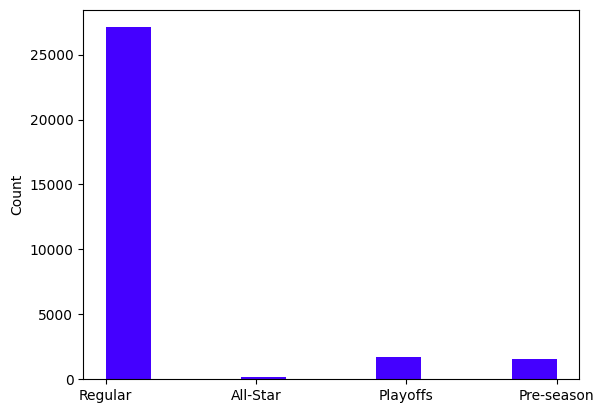

In [ ]:
#Graficamos el tipo de temporada
plt.hist(game_data['season_type_2'], histtype="bar", rwidth=1.2,color='#4400ff')
plt.ylabel('Count')
plt.plot()

In [64]:
#Exploramos la concurrencia del partido
attendance = game_data['attendance'].replace(0, np.nan).describe().round(2)
attendance

count     26652.00
mean      17243.38
std        4220.28
min         256.00
25%       15637.75
50%       18064.00
75%       19440.00
max      108713.00
Name: attendance, dtype: float64

In [65]:
#Exploramos
game_data['matchup_home'].describe()


count           30576
unique           1309
top       WST vs. EST
freq              117
Name: matchup_home, dtype: object

In [81]:
#Veamos si ganan más partidos los equipos de casa vs visitantes
game_data[['wl_home', 'wl_away']].value_counts(normalize=True) * 100

wl_home  wl_away
W        L          58.9809
L        W          41.0191
Name: proportion, dtype: float64

In [89]:
game_data_num = game_data.select_dtypes(include='number')
game_stats = pd.DataFrame({
    'home_mean': game_data_num[[col for col in game_data_num.columns if col.endswith('_home')]].mean().round(2),
    'away_mean': game_data_num[[col for col in game_data_num.columns if col.endswith('_away')]].mean().round(2)
})
print(game_stats)

                      home_mean  away_mean
ast_away                    NaN      21.61
ast_home                  23.02        NaN
blk_away                    NaN       4.60
blk_home                   5.12        NaN
dreb_away                   NaN      31.30
...                         ...        ...
total_turnovers_home      11.89        NaN
tov_away                    NaN      14.72
tov_home                  14.41        NaN
video_available_away        NaN       0.43
video_available_home       0.43        NaN

[86 rows x 2 columns]


In [83]:
#Promedio de puntos por partido, anotaciones, anotaciones triples, faltas, asistencias
game_data[['pts_home','pts_away', 'fg_pct_home','fg_pct_away','fg3_pct_home','fg3_pct_away', 'pf_home','pf_away', 'ast_home','ast_away']].mean().round(2)

pts_home        103.34
pts_away        100.44
fg_pct_home       0.46
fg_pct_away       0.45
fg3_pct_home      0.36
fg3_pct_away      0.35
pf_home          20.81
pf_away          21.44
ast_home         23.02
ast_away         21.61
dtype: float64

Análisis de la tabla play_by_play

In [ ]:
# Preparar columnas para el formateo
columnas_string = ['player_id', 'player_name', 'school', 'country', 'last_affiliation', 'jersey', 'position', 
'team_id', 'team_name', 'team_abbreviation', 'team_code', 'team_city', 'playercode',
'position', 'draft_type', 'organization', 'organization_type', 'game_id', 'team_id_home',
'team_abbreviation_home', 'team_name_home', 'matchup_home', 'team_id_away',
'team_abbreviation_away', 'team_name_away', 'matchup_away', 'season_type', 'team_city_name_home',
'team_nickname_home', 'team_city_name_away', 'team_nickname_away', 'league_id', 'eventnum',
'eventmsgtype', 'eventmsgactiontype', 'homedescription', 'visitordescription', 'score',
'person1type', 'player1_id', 'player1_name', 'player1_team_id', 'player1_team_city', 
'player1_team_nickname', 'player1_team_abbreviation', 'player2_id', 'player2_name',
'player2_team_id', 'player2_team_city', 'player2_team_nickname', 'player2_team_abbreviation',
'player3_id', 'player3_name', 'player3_team_id', 'player3_team_city', 'player3_team_nickname',
'player3_team_abbreviation', 'owner', 'generalmanager', 'headcoach', 'dleagueaffiliation', 'team_state',
'season_exp', 'from_year', 'to_year', 'draft_year', 'round_pick', 'draft_number', 'season', 'round_number',
'overall_pick', 'season_id', 'arena','yearfounded','year_founded']
columnas_bool = ['rosterstatus', 'games_played_current_season_flag', 'dleague_flag', 'nba_flag',
'games_played_flag', 'greatest_75_flag', 'player_profile_flag', 'wl_home', 'video_available_home',
'wl_away', 'video_available_away', 'video_available_flag', 'is_active']
columnas_date = ['birthdate', 'game_date']
columnas_timestring = ['game_time', 'wctimestring', 'pctimestring']
columnas_pulgadas = ['height', 'height_wo_shoes', 'height_w_shoes', 'wingspan', 'standing_reach', 'hand_length',
'hand_width', 'standing_vertical_leap', 'max_vertical_leap']
columnas_libras = ['weight']
columnas_float3 = ['body_fat_pct', 'fg_pct_home', 'fg3_pct_home', 'ft_pct_home', 'fg_pct_away', 'fg3_pct_away', 'ft_pct_away']
columnas_tiempo = ['lane_agility_time', 'modified_lane_agility_time', 'three_quarter_sprint']
columnas_int = ['bench_press', 'attendance', 'fgm_home',
'fga_home', 'fg3m_home', 'fg3a_home', 'ftm_home', 'fta_home', 'oreb_home', 'dreb_home',
'reb_home', 'ast_home', 'stl_home', 'blk_home', 'tov_home', 'pts_home', 'plus_minus_home',
'fgm_away', 'fga_away', 'fg3m_away', 'fg3a_away', 'ftm_away', 'fta_away', 'oreb_away',
'dreb_away', 'reb_away', 'ast_away', 'stl_away', 'blk_away', 'tov_away', 'pf_away', 'pts_away',
'plus_minus_away', 'game_sequence', 'pts_qtr1_home', 'pts_qtr2_home', 'pts_qtr3_home',
'pts_qtr4_home', 'pts_ot1_home', 'pts_ot2_home', 'pts_ot3_home', 'pts_ot4_home', 'pts_ot5_home',
'pts_ot6_home', 'pts_ot7_home', 'pts_ot8_home', 'pts_ot9_home', 'pts_ot10_home', 'pts_home',
'pts_qtr1_away', 'pts_qtr2_away', 'pts_qtr3_away', 'pts_qtr4_away', 'pts_ot1_away',
'pts_ot2_away', 'pts_ot3_away', 'pts_ot4_away', 'pts_ot5_away', 'pts_ot6_away', 'pts_ot7_away',
'pts_ot8_away', 'pts_ot9_away', 'pts_ot10_away', 'pts_away', 'pts_paint_home', 'pts_2nd_chance_home',
'pts_fb_home', 'largest_lead_home', 'lead_changes', 'times_tied', 'team_turnovers_home',
'total_turnovers_home', 'team_rebounds_home', 'pts_off_to_home', 'pts_paint_away',
'pts_2nd_chance_away', 'pts_fb_away', 'largest_lead_away', 'team_turnovers_away',
'total_turnovers_away', 'team_rebounds_away', 'pts_off_to_away', 'period', 'scoremargin',
'arenacapacity']
columnas_fracciones = ['spot_fifteen_corner_left', 'spot_fifteen_break_left', 'spot_fifteen_top_key',
'spot_fifteen_break_right', 'spot_fifteen_corner_right', 'spot_college_corner_left',
'spot_college_break_left', 'spot_college_top_key', 'spot_college_break_right',
'spot_college_corner_right', 'spot_nba_corner_left', 'spot_nba_break_left',
'spot_nba_top_key', 'spot_nba_break_right', 'spot_nba_corner_right',
'off_drib_fifteen_break_left', 'off_drib_fifteen_top_key', 'off_drib_fifteen_break_right',
'off_drib_college_break_left', 'off_drib_college_top_key', 'off_drib_college_break_right',
'on_move_fifteen', 'on_move_college']
columnas_ratios = ['team_wins_losses_home', 'team_wins_losses_away']

In [ ]:
# Aplicacion de formatos correspondientes
# Recorrer cada DataFrame en la lista tables
for df in tables:
    
    # Convertir columnas a string
    for col in globals()[df].columns.intersection(columnas_string + columnas_bool + columnas_timestring):
        globals()[df][col] = globals()[df][col].astype(str)
    
    # Convertir columnas a datetime
    for col in globals()[df].columns.intersection(columnas_date):
        globals()[df][col] = pd.to_datetime(globals()[df][col])  # 'coerce' convierte valores inválidos a NaT
    
    ''' # Aplicar formato para columnas en pulgadas
    for col in globals()[df].columns.intersection(columnas_pulgadas):
        globals()[df][col] = globals()[df][col].astype(float).map(lambda x: f"{x:.2f} in")
    
    # Aplicar formato para columnas en libras
    for col in globals()[df].columns.intersection(columnas_libras):
        globals()[df][col] = globals()[df][col].astype(float).map(lambda x: f"{x:.2f} lbs")'''
    
    # Aplicar formato para columnas float con 3 decimales
    for col in globals()[df].columns.intersection(columnas_float3 + columnas_fracciones + columnas_pulgadas + columnas_libras + columnas_tiempo):
        globals()[df][col] = globals()[df][col].astype(float).round(3)
    
    '''# Aplicar formato para columnas de tiempo en segundos
    for col in globals()[df].columns.intersection(columnas_tiempo):
        globals()[df][col] = globals()[df][col].astype(float).map(lambda x: f"{x:.3f} segs")'''
    
    # Convertir columnas a enteros
    for col in globals()[df].columns.intersection(columnas_int):
        globals()[df][col] = globals()[df][col].astype(int)

info_eventmsgtype['eventmsgtype'] = info_eventmsgtype['eventmsgtype'].astype(str)


In [ ]:
# Declaracion de listas de columnas para la exploracion

columnas_medidas = ['lane_agility_time', 'modified_lane_agility_time', 'three_quarter_sprint','height',
                'height_w_shoes', 'wingspan', 'standing_reach', 'hand_length', 'hand_width', 'standing_vertical_leap',
                'max_vertical_leap','weight','body_fat_pct','bench_press','spot_fifteen_corner_left',
                'spot_fifteen_break_left', 'spot_fifteen_top_key','spot_fifteen_break_right', 'spot_fifteen_corner_right',
                'spot_college_corner_left','spot_college_break_left', 'spot_college_top_key', 'spot_college_break_right',
                'spot_college_corner_right', 'spot_nba_corner_left', 'spot_nba_break_left',
                'spot_nba_top_key', 'spot_nba_break_right', 'spot_nba_corner_right',
                'off_drib_fifteen_break_left', 'off_drib_fifteen_top_key', 'off_drib_fifteen_break_right',
                'off_drib_college_break_left', 'off_drib_college_top_key', 'off_drib_college_break_right',
                'on_move_fifteen', 'on_move_college']

columnas_desempeño =['Jump Shot','Tip Ball','Ejection','MISS Jump Shot','Free Throw','REBOUND','Turnover','S.FOUL',
                     'Violation','SUB','Timeout']

columnas_dimensiones = ['lane_agility_time', 'modified_lane_agility_time', 'three_quarter_sprint','height',
                'height_w_shoes', 'wingspan', 'standing_reach', 'hand_length', 'hand_width', 'standing_vertical_leap',
                'max_vertical_leap','weight','body_fat_pct','bench_press']

In [ ]:
# Realiza el merge entre play_by_play e info_eventmsgtype basado en la columna 'eventmsgtype'
play_by_play = play_by_play.merge(
    info_eventmsgtype[['eventmsgtype', 'description']],
    on='eventmsgtype',
    how='left'  # Realiza un left join para mantener todos los registros de play_by_play
)

# Elimina las columnas homedescription y visitordescription
play_by_play.drop(columns=['homedescription', 'visitordescription'], inplace=True)

# Imprime el DataFrame para verificar los cambios
print(play_by_play) 

        Unnamed: 0   game_id eventnum eventmsgtype eventmsgactiontype  period  \
0                0  21300003      559            8                  0       4   
1                1  21300003      564            1                  1       4   
2                2  21300001      131            2                  1       2   
3                3  21300001      136            6                  2       2   
4                4  21300001      168            5                  1       2   
...            ...       ...      ...          ...                ...     ...   
726407      726407  42200404      574            6                  2       4   
726408      726408  42200404      581            1                  2       4   
726409      726409  42200404      590            4                  0       4   
726410      726410  42200404      602            1                 50       4   
726411      726411  42200404      606            4                  0       4   

       wctimestring pctimes

In [ ]:
# Crear el nuevo DataFrame usando groupby y pivot_table para contar las ocurrencias de cada 'description' por 'player1_name'
player_performance = play_by_play.pivot_table(
    index='player1_id', 
    columns='description', 
    aggfunc='size', 
    fill_value=0  # Rellena con 0 donde no hay ocurrencias
).reset_index()

# Renombrar la columna 'player1_name' a 'player_name'
player_performance.rename(columns={'player1_id': 'player_id'}, inplace=True)

# Imprimir el DataFrame para verificar el resultado
print(player_performance)


description player_id  Ejection  Free Throw  Jump Shot  MISS Jump Shot   \
0              101106         0           0          6                1   
1              101107         0           0         66                8   
2              101108         0           0         49               24   
3              101109         0           0         19               11   
4              101110         0           0          1                0   
...               ...       ...         ...        ...              ...   
1585              708         0           0          1                0   
1586              951         0           0          0                1   
1587              965         0           0          5                0   
1588              977         0           0         26                6   
1589              979         0           0          0                1   

description  REBOUND  S.FOUL  SUB  Timeout  Tip Ball  Turnover  Violation  
0                  0   

In [ ]:
# Realiza el merge entre
player_performance = player_performance.merge(
    player_info[['player_id','player_name','team_abbreviation']],
    on='player_id',
    how='left'  # Realiza un left join para mantener todos los registros de player_performance
)

# Imprime el DataFrame para verificar los cambios
print(player_performance)

     player_id  Ejection  Free Throw  Jump Shot  MISS Jump Shot   REBOUND  \
0       101106         0           0          6                1        0   
1       101107         0           0         66                8        0   
2       101108         0           0         49               24        0   
3       101109         0           0         19               11        0   
4       101110         0           0          1                0        0   
...        ...       ...         ...        ...              ...      ...   
1585       708         0           0          1                0        0   
1586       951         0           0          0                1        0   
1587       965         0           0          5                0        0   
1588       977         0           0         26                6        0   
1589       979         0           0          0                1        0   

      S.FOUL  SUB  Timeout  Tip Ball  Turnover  Violation player_name  \
0 

In [ ]:
# Filtrar player_performance para que solo contenga los player_id que están en draft_history_stats
player_performance = player_performance[
    player_performance['player_id'].isin(draft_history_stats['player_id'])
]


In [ ]:
# Resetear el índice del DataFrame filtrado y actualizar en place
player_performance = player_performance.reset_index(drop=True)

print(player_performance['team_abbreviation'].nunique())


31


In [ ]:
# Elimina espacios al inicio y final de los nombres de columna
player_performance.columns = player_performance.columns.str.strip()

# Asegúrate de que los registros 'Jump Shot' y 'MISS Jump Shot' existen en el DataFrame
if 'Jump Shot' in player_performance.columns and 'MISS Jump Shot' in player_performance.columns:
    # Calcula la precisión de tiros como "Jump Shot / (Jump Shot + MISS Jump Shot)"
    player_performance['Accuracy'] = np.divide(
        player_performance['Jump Shot'],
        player_performance['Jump Shot'] + player_performance['MISS Jump Shot'],
        out=np.zeros_like(player_performance['Jump Shot'], dtype=float),  # Para que devuelva 0 cuando hay división por cero
        where=(player_performance['Jump Shot'] + player_performance['MISS Jump Shot']) != 0  # Evita dividir entre cero
    )

# Mostrar el resultado
print(player_performance[['Jump Shot', 'MISS Jump Shot', 'Accuracy']].head())

   Jump Shot  MISS Jump Shot  Accuracy
0        475             698  0.404945
1         67             132  0.336683
2        326             554  0.370455
3         34              86  0.283333
4       1527            1013  0.601181


In [ ]:
# Contar juegos únicos ('game_id') por cada jugador ('player1_name') en play_by_play
games_played = play_by_play.groupby('player1_name')['game_id'].nunique().reset_index()
games_played.columns = ['player_name', 'Games Played']  # Renombrar columnas para el merge
# Filtrar player_performance para que solo contenga los player_id que están en draft_history_stats
games_played = games_played[
    games_played['player_name'].isin(draft_history_stats['player_name'])
]

# Agregar la columna 'Games Played' a player_performance usando un merge en 'player_name'
player_performance = player_performance.merge(games_played, on='player_name', how='left')

# Llenar NaN en caso de que algún jugador en player_performance no tenga registros en play_by_play
player_performance['Games Played'].fillna(0, inplace=True)

print(player_performance)

    player_id  Ejection  Free Throw  Jump Shot  MISS Jump Shot  REBOUND  \
0     1626147         0         284        475             698      646   
1     1626148         0          23         67             132      109   
2     1626150         1         409        326             554      309   
3     1626151         0          36         34              86       52   
4     1626158         2         839       1527            1013     2206   
..        ...       ...         ...        ...             ...      ...   
196    203947         0           4          1               0        1   
197    203948         0         108        230             339      377   
198    203949         0         153        153             144      242   
199    203950         0          64         68              59      116   
200    204456         0         373       1641            1640     1583   

     S.FOUL   SUB  Timeout  Tip Ball  Turnover  Violation  \
0       306   386        0         1  

C:\Users\opqui\AppData\Local\Temp\ipykernel_10804\939422736.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  player_performance['Games Played'].fillna(0, inplace=True)


In [ ]:
# Itera sobre cada columna en la lista columnas_desempeño
for columna in columnas_desempeño:
    # Genera el nombre de la nueva columna "PG_(nombredecolumna)"
    nueva_columna = f"Per Game {columna}"
    
    # Calcula la nueva columna como columna / Games Played, manejando divisiones por 0
    player_performance[nueva_columna] = player_performance.apply(
        lambda row: row[columna] / row['Games Played'] if row['Games Played'] != 0 else 0,
        axis=1
    )

# Mostrar una muestra del DataFrame resultante para verificar
print(player_performance)

pg_columnas_desempeño = ['Accuracy','Per Game Jump Shot','Per Game Tip Ball','Per Game Ejection','Per Game MISS Jump Shot',
                         'Per Game Free Throw','Per Game REBOUND','Per Game Turnover','Per Game S.FOUL','Per Game Violation',
                         'Per Game SUB']


    player_id  Ejection  Free Throw  Jump Shot  MISS Jump Shot  REBOUND  \
0     1626147         0         284        475             698      646   
1     1626148         0          23         67             132      109   
2     1626150         1         409        326             554      309   
3     1626151         0          36         34              86       52   
4     1626158         2         839       1527            1013     2206   
..        ...       ...         ...        ...             ...      ...   
196    203947         0           4          1               0        1   
197    203948         0         108        230             339      377   
198    203949         0         153        153             144      242   
199    203950         0          64         68              59      116   
200    204456         0         373       1641            1640     1583   

     S.FOUL   SUB  Timeout  Tip Ball  ...  Per Game Tip Ball  \
0       306   386        0         

Gráficas

In [ ]:

# Calcular el primer cuartil de 'Games Played'
q1_games_played = player_performance['Games Played'].quantile(0.1)

# Filtrar player_performance para incluir solo los registros con 'Games Played' mayor que el primer cuartil
filtered_player_performance = player_performance[player_performance['Games Played'] > q1_games_played]

# Suponiendo que los DataFrames draft_history_stats y player_performance tienen una columna 'player_name' para unir ambos
merged_df = draft_history_stats[['player_name'] + columnas_medidas].merge(
    filtered_player_performance[['player_name'] + pg_columnas_desempeño + ['team_abbreviation']],
    on='player_name',
    how='inner'  # Solo los jugadores que existen en ambos dataframes
)

# Crear la cuadrícula de gráficos de dispersión
num_rows = len(columnas_medidas)
num_cols = len(pg_columnas_desempeño)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))
fig.suptitle("Grid de Scatterplots entre Medidas del Draft y Desempeño de Jugadores", fontsize=16)

for i, col_medida in enumerate(columnas_medidas): 
    for j, pg_col_desempeño in enumerate(pg_columnas_desempeño):
        ax = axes[i, j] if num_rows > 1 and num_cols > 1 else axes[i or j]  # Adaptar el índice si es una fila o columna
        sns.scatterplot(
            data= merged_df,
            x=merged_df[col_medida],
            y=merged_df[pg_col_desempeño],
            ax=ax
        )
        ax.set_xlabel(col_medida)
        ax.set_ylabel(pg_col_desempeño)
        ax.set_title(f"{col_medida} vs {pg_col_desempeño} top 10%")
    print(f'{i+1}/{num_rows}')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar para evitar solapamiento con el título principal
plt.show()


1/37
2/37
3/37
4/37
5/37
6/37
7/37
8/37
9/37
10/37
11/37
12/37
13/37
14/37
15/37
16/37
17/37
18/37
19/37
20/37
21/37
22/37
23/37
24/37
25/37
26/37
27/37
28/37
29/37
30/37
31/37
32/37
33/37
34/37
35/37
36/37
37/37


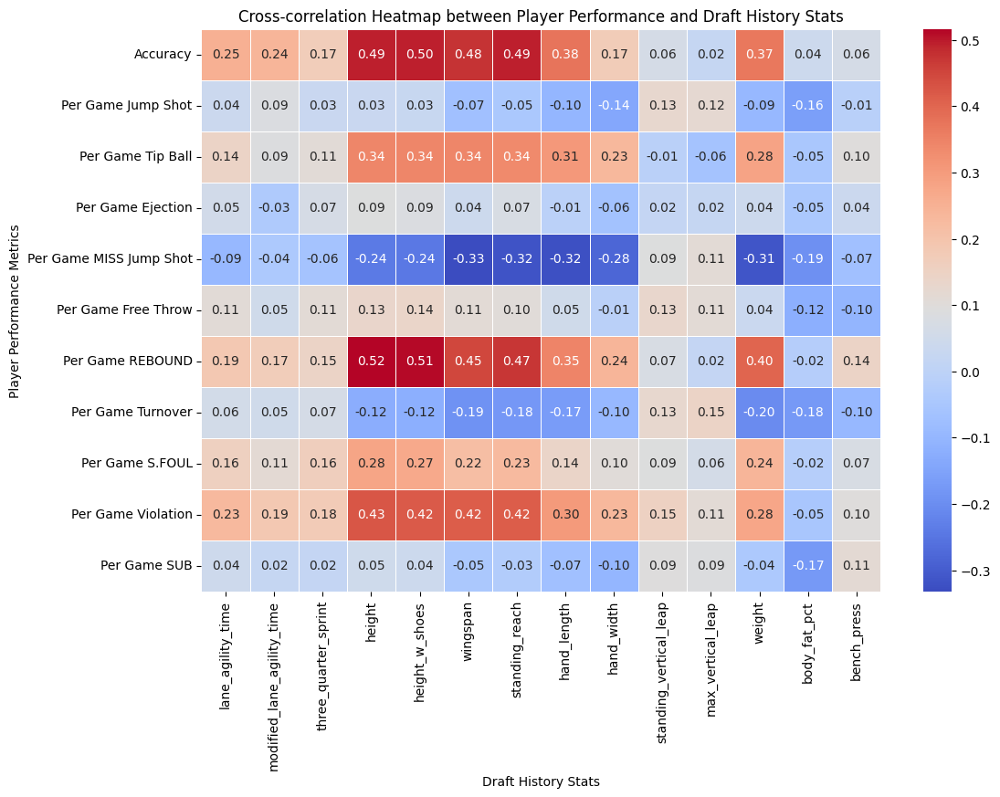

In [ ]:

# Crear el DataFrame para almacenar las correlaciones cruzadas
correlation_matrix = pd.DataFrame(
    index=pg_columnas_desempeño,
    columns=columnas_dimensiones
)

# Calcular la correlación cruzada entre cada columna de desempeño y cada columna de medidas
for col_desempeño in pg_columnas_desempeño:
    for col_medida in columnas_dimensiones:
        correlation_matrix.loc[col_desempeño, col_medida] = merged_df[col_desempeño].corr(merged_df[col_medida])

# Convertir a float para el heatmap y asegurar que no haya errores de tipo
correlation_matrix = correlation_matrix.astype(float)

# Crear el heatmap con las correlaciones cruzadas
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Cross-correlation Heatmap between Player Performance and Draft History Stats")
plt.xlabel("Draft History Stats")
plt.ylabel("Player Performance Metrics")
plt.show()


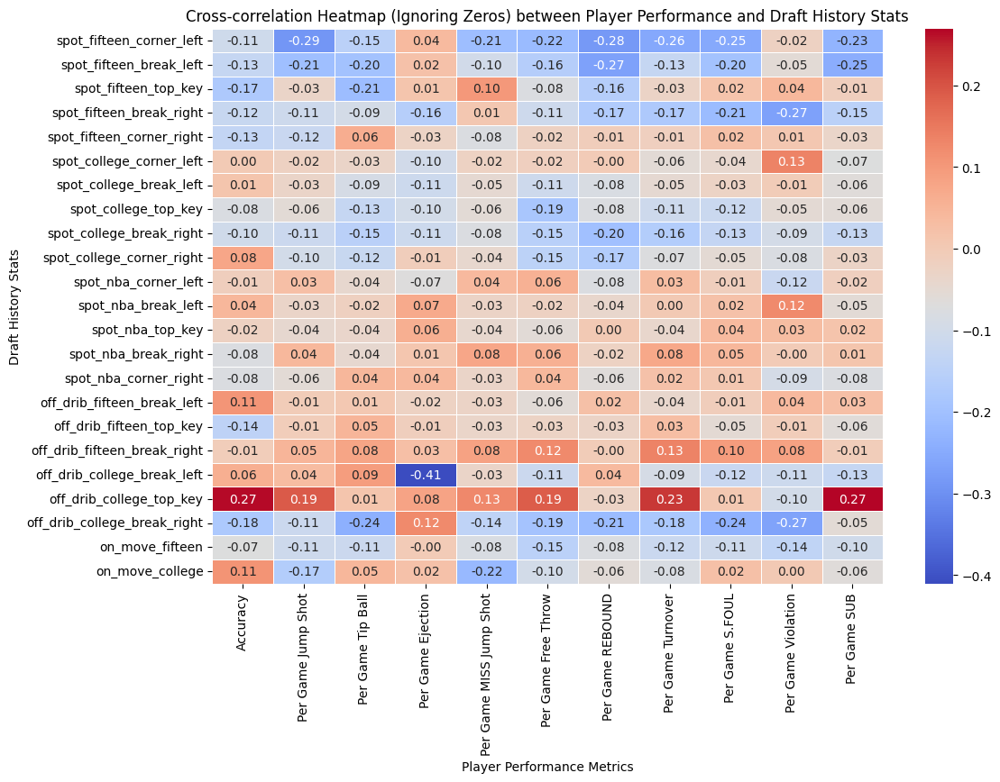

In [ ]:

# Crear una matriz vacía para las correlaciones
correlation_matrix = pd.DataFrame(index=columnas_fracciones, columns=pg_columnas_desempeño)

# Calcular la correlación para cada combinación de columnas
for medida in columnas_fracciones:
    for desempeño in pg_columnas_desempeño:
        # Filtrar filas donde la columna de medida no es cero
        filtered_data = draft_history_stats[[medida]].join(player_performance[[desempeño]])
        filtered_data = filtered_data[filtered_data[medida] != 0]
        
        # Calcular la correlación y almacenar el resultado
        if not filtered_data.empty:
            correlation_matrix.loc[medida, desempeño] = filtered_data[medida].corr(filtered_data[desempeño])
        else:
            correlation_matrix.loc[medida, desempeño] = np.nan  # Si no hay datos para correlacionar, usar NaN

# Convertir los datos a float y reemplazar NaN por 0 (opcional)
correlation_matrix = correlation_matrix.astype(float).fillna(0)

# Graficar el heatmap sin anotaciones
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5, 
            xticklabels=pg_columnas_desempeño, yticklabels=columnas_fracciones)
plt.title("Cross-correlation Heatmap (Ignoring Zeros) between Player Performance and Draft History Stats")
plt.xlabel("Player Performance Metrics")
plt.ylabel("Draft History Stats")
plt.show()


1/37
2/37
3/37
4/37
5/37
6/37
7/37
8/37
9/37
10/37
11/37
12/37
13/37
14/37
15/37
16/37
17/37
18/37
19/37
20/37
21/37
22/37
23/37
24/37
25/37
26/37
27/37
28/37
29/37
30/37
31/37
32/37
33/37
34/37
35/37
36/37
37/37


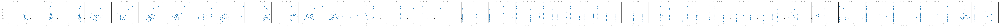

In [ ]:
# Filtrar registros en player_performance donde 'Jump Shot' está por encima de la mediana
median_jump_shot = player_performance['Jump Shot'].median()
filtered_performance = player_performance[player_performance['Jump Shot'] > median_jump_shot]

# Realizar un merge para combinar player_performance filtrado con draft_history_stats basado en 'player_id'
merged_data = filtered_performance.merge(draft_history_stats[['player_name'] + columnas_medidas], on='player_name', how='inner')

# Configurar el tamaño de la cuadrícula de gráficos (una fila por cada columna en 'columnas_medidas')
num_columns = len(columnas_medidas)
fig, axes = plt.subplots(1, num_columns, figsize=(5 * num_columns, 5), sharey=True)

# Generar los scatter plots para cada columna de 'columnas_medidas' comparando con 'accuracy'
for i, col in enumerate(columnas_medidas):
    sns.scatterplot(
        x=merged_data[col],
        y=merged_data['Accuracy'],
        ax=axes[i]
    )
    axes[i].set_title(f'Accuracy vs {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Accuracy')
    print(f'{i+1}/{len(columnas_medidas)}')

# Ajustar el layout para mejor visualización
plt.tight_layout()
plt.show()